Labs
1. Code the correlation/convolution operator in Python
with loops, without relying on Python convolution function
using functions available in Python (e.g. NumPy, SciPy)
pay attention to borders and value range!
2. Apply correlation/convolution with basic kernels
W = 0 W = Id W = 1
, ,
∣W ∣ w
lower/greater/equal to 1, equal to 0 (with some i
negative)

Dimensions: (5490, 5490)
Resolution: 20.0 meters per pixel
Coordinate Reference System (CRS): EPSG:32619


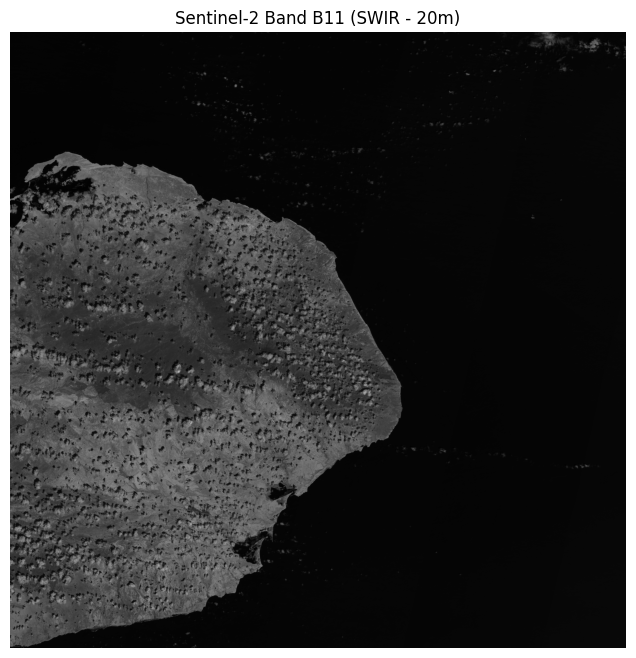

In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Path to one of the bands inside the R20m folder
band_path = '/Users/angelicamariamorenorojas/Desktop/Master/Image processing/UBS_ERSIP/S2C_MSIL2A_20251006T151731_N0511_R125_T19PBP_20251006T195013.SAFE/GRANULE/L2A_T19PBP_A005672_20251006T151734/image_DATA/R20m/T19PBP_20251006T151731_B11_20m.jp2'

# Read the band
with rasterio.open(band_path) as src:
    band = src.read(1)          # Read the first (and only) band
    meta = src.meta             # Metadata (dimensions, resolution, CRS)

print("Dimensions:", band.shape)
print("Resolution:", meta['transform'][0], "meters per pixel")
print("Coordinate Reference System (CRS):", meta['crs'])

# Display in black and white
plt.figure(figsize=(8, 8))
plt.imshow(band, cmap='gray')
plt.title("Sentinel-2 Band B11 (SWIR - 20m)")
plt.axis('off')
plt.show()



In [70]:
# 1. Correlation

import numpy as np

def correlation(image, kernel): 
    # Get the dimensions of the image and kernel
    image_rows, image_cols = image.shape
    kernel_rows, kernel_cols = kernel.shape
    
    # Calculate the padding size
    pad_rows = kernel_rows // 2 
    pad_cols = kernel_cols // 2

    image_padded = np.pad(image, ((pad_rows, pad_rows), (pad_cols, pad_cols)), mode='constant', constant_values=0)

    # 4. Create the output array (same size as original image)
    output = np.zeros_like(image, dtype=float)

    # 5. Apply the correlation operator
    for i in range(pad_rows, image_rows + pad_rows):
        for j in range(pad_cols, image_cols + pad_cols):
            # Extract the current region from the padded image
            region = image_padded[i-pad_rows:i+pad_rows+1, j-pad_cols:j+pad_cols+1] 
            
            # Perform the correlation operation
            output[i-pad_rows, j-pad_cols] = np.sum(region * kernel)

    return output


In [71]:
result = correlation(band, np.ones((3,3)))
result

array([[ 4642.,  6992.,  7021., ...,  7818.,  7806.,  5206.],
       [ 7036., 10585., 10646., ..., 11742., 11713.,  7808.],
       [ 7179., 10780., 10835., ..., 11722., 11714.,  7815.],
       ...,
       [ 7844., 11758., 11747., ..., 12760., 12764.,  8512.],
       [ 7848., 11764., 11747., ..., 12840., 12792.,  8483.],
       [ 5241.,  7850.,  7831., ...,  8618.,  8567.,  5666.]],
      shape=(5490, 5490))

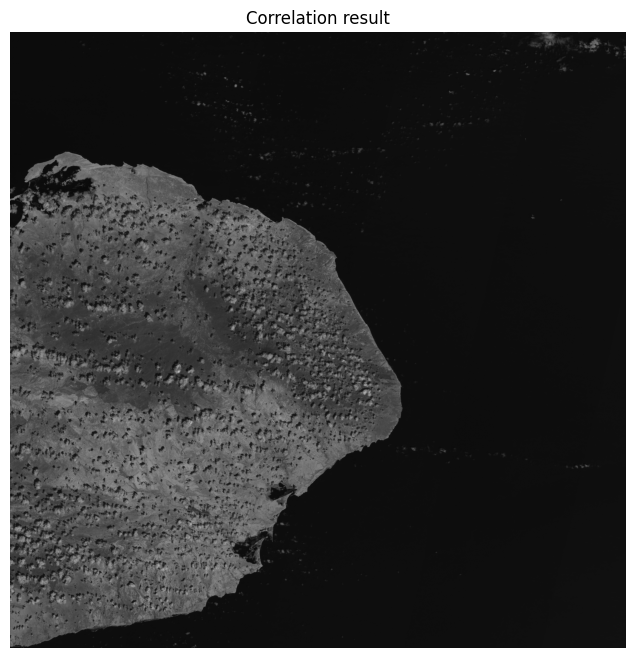

In [72]:
plt.figure(figsize=(8, 8))
plt.imshow(result, cmap='gray')
plt.title("Correlation result")
plt.axis('off')
plt.show()

In [73]:
#1. Convolution 
import numpy as np

def convolution (image,kernel):
    # Get the dimensions of the image and kernel
    image_rows, image_cols = image.shape
    kernel_rows, kernel_cols = kernel.shape
    
    # Calculate the padding size
    pad_rows = kernel_rows // 2 
    pad_cols = kernel_cols // 2

    image_padded = np.pad(image, ((pad_rows, pad_rows), (pad_cols, pad_cols)), mode='constant', constant_values=0)

    kernel_flipped = np.flipud(np.fliplr(kernel))

     # Create the output array (same size as original image)
    output = np.zeros_like(image, dtype=float)

    # 5. Apply the correlation operator
    for i in range(pad_rows, image_rows + pad_rows):
        for j in range(pad_cols, image_cols + pad_cols):
            # Extract the current region from the padded image
            region = image_padded[i-pad_rows:i+pad_rows+1, j-pad_cols:j+pad_cols+1] 
            
            # Perform the correlation operation
            output[i-pad_rows, j-pad_cols] = np.sum(region * kernel_flipped)

    return output    


In [74]:
result_convolution = convolution(band, np.ones((3,3)))
result_convolution

array([[ 4642.,  6992.,  7021., ...,  7818.,  7806.,  5206.],
       [ 7036., 10585., 10646., ..., 11742., 11713.,  7808.],
       [ 7179., 10780., 10835., ..., 11722., 11714.,  7815.],
       ...,
       [ 7844., 11758., 11747., ..., 12760., 12764.,  8512.],
       [ 7848., 11764., 11747., ..., 12840., 12792.,  8483.],
       [ 5241.,  7850.,  7831., ...,  8618.,  8567.,  5666.]],
      shape=(5490, 5490))

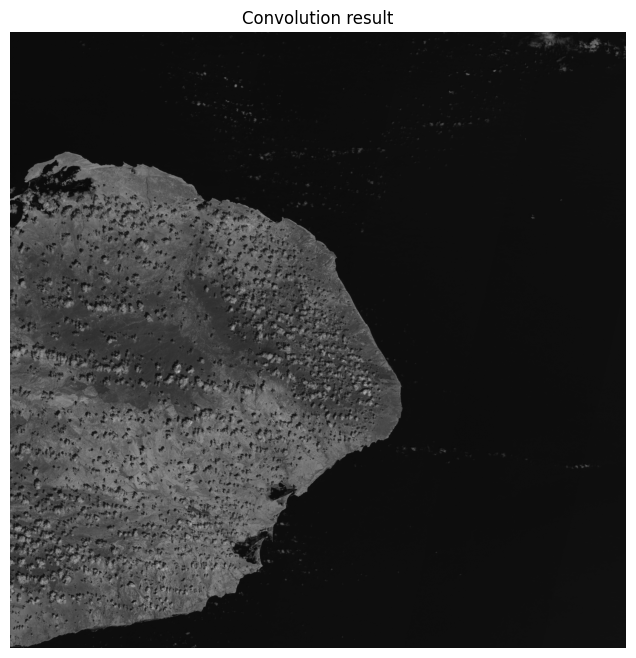

In [75]:
plt.figure(figsize=(8, 8))
plt.imshow(result_convolution, cmap='gray')
plt.title("Convolution result")
plt.axis('off')
plt.show()

In [76]:
import cv2
import numpy as np
import scipy
import matplotlib.pyplot as plt

# kernel
kernel = np.ones((3,3), np.float32) / (3*3)
    
# Aplicar filtro con filter2D
result = cv2.filter2D(band, -1, kernel)
    

In [77]:
result


array([[1161, 1168, 1173, ..., 1305, 1304, 1306],
       [1172, 1176, 1183, ..., 1305, 1301, 1303],
       [1196, 1198, 1204, ..., 1302, 1302, 1304],
       ...,
       [1307, 1306, 1305, ..., 1418, 1418, 1419],
       [1307, 1307, 1305, ..., 1427, 1421, 1413],
       [1310, 1309, 1306, ..., 1431, 1424, 1413]],
      shape=(5490, 5490), dtype=uint16)

In [2]:

A1 = np.array([
    [0, 0, 0],
    [0, 0, 0],
    [0, 0, 0]
])

A2 = np.array([
    [0, 0, 0],
    [0, 1, 0],
    [0, 0, 0]
])

A3 = np.array([
    [1, 1, 1],
    [1, 1, 1],
    [1, 1, 1]
])

A4 = np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
])

A5 = np.array([
    [-1, -1, -1],
    [-1,  8, -1],
    [-1, -1, -1]
])

A6 = np.array([
    [0, -1, 0],
    [-1, 4, -1],
    [0, -1, 0]
])

A7 = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

A8 = np.array([
    [-1, -1, -1],
    [ 0,  0,  0],
    [ 1,  1,  1]
])

A9 = np.array([
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]
])


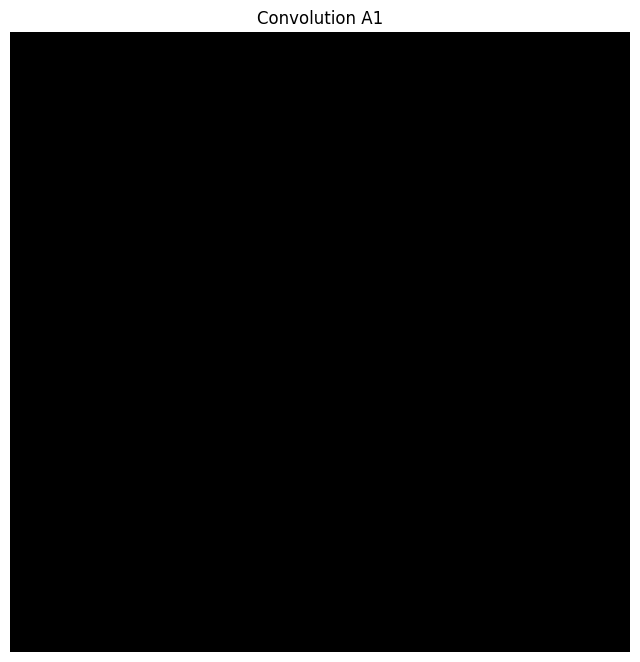

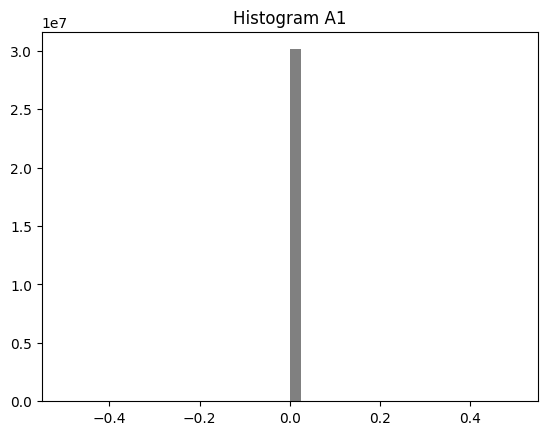

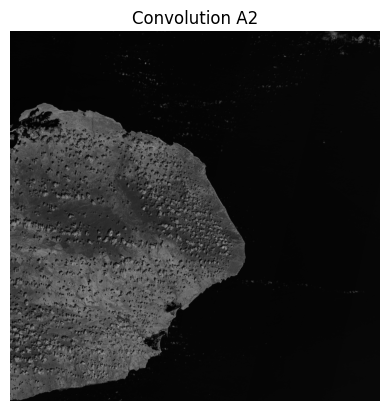

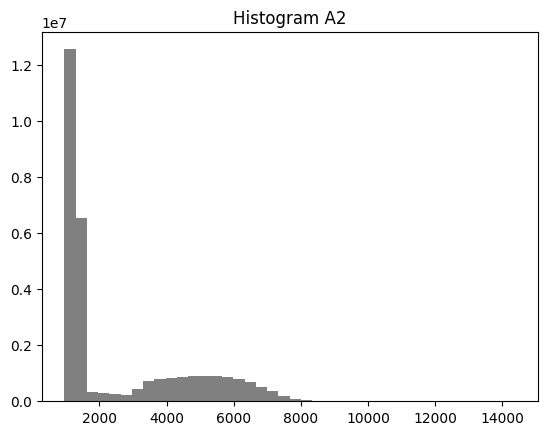

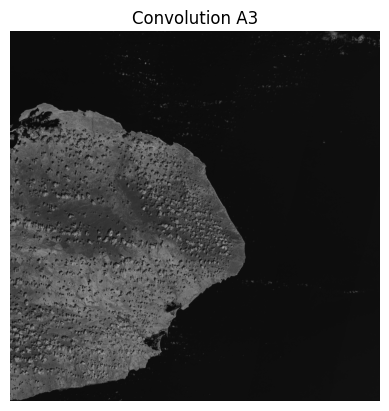

...

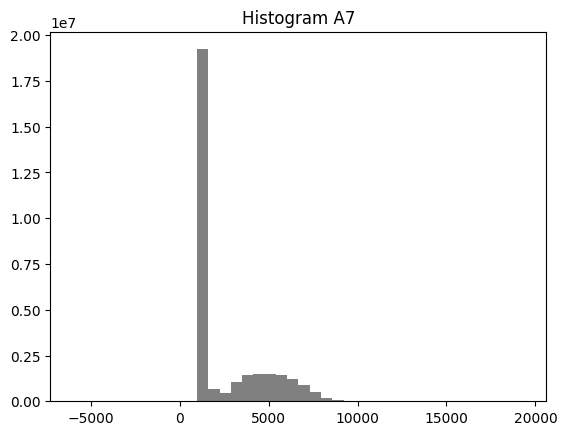

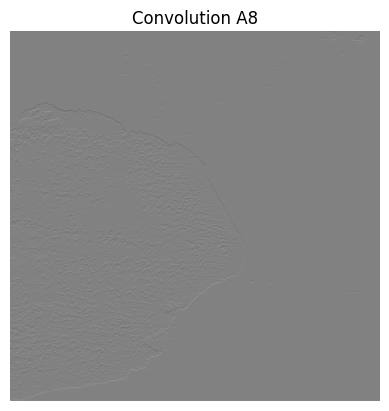

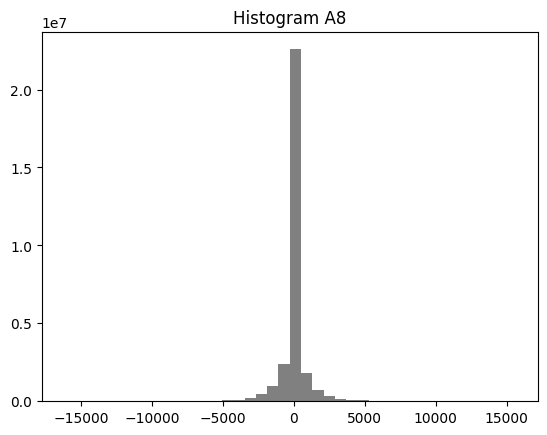

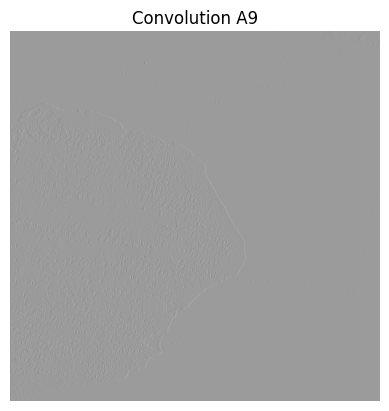

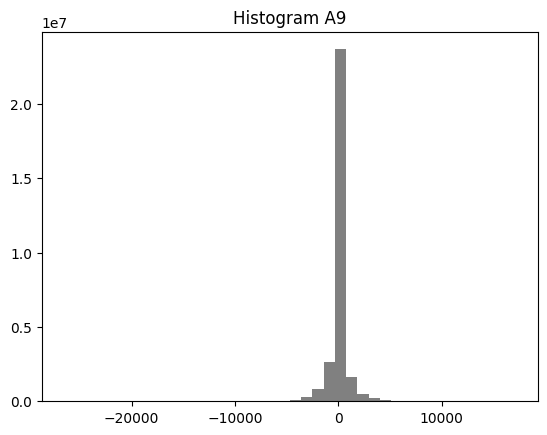

In [88]:
plt.figure(figsize=(8, 25))  # alto grande, ancho moderado

for i in range(1, 10):
    # aplicar convolución
    result = scipy.signal.convolve2d(band, eval(f"A{i}"), mode='same', boundary='fill', fillvalue=0)

    # imagen
    plt.imshow(result, cmap='gray')
    plt.title(f"Convolution A{i}")
    plt.axis('off')
    plt.show()

    # histograma
    plt.hist(result.ravel(), bins=40, color='gray')
    plt.title(f"Histogram A{i}")
    plt.show()



when w = 0, the image is completly black, with the w=id the image keeps the same and with w=1 keeps the brigtness but the edges are intesified (case A5)

In [59]:
import cv2
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

# Load example image (grayscale)
image = cv2.imread("DJI_0073.JPG", cv2.IMREAD_GRAYSCALE)
res_signal = signal.convolve2d(image, A4)
res_opencv = cv2.filter2D(image, -1, A4/16, borderType=cv2.BORDER_CONSTANT)


In [26]:
res_signal


array([[  74,  210,  284, ...,  179,   96,   25],
       [ 220,  626,  841, ...,  532,  323,   93],
       [ 293,  841, 1119, ...,  714,  506,  161],
       ...,
       [  75,  222,  290, ..., 2581, 1909,  629],
       [  54,  164,  226, ..., 1932, 1429,  472],
       [  17,   53,   77, ...,  635,  469,  155]], shape=(3002, 4002))

In [27]:
res_opencv

array([[ 39,  53,  56, ...,  35,  33,  20],
       [ 53,  70,  74, ...,  43,  45,  32],
       [ 53,  69,  71, ...,  44,  47,  37],
       ...,
       [ 13,  18,  18, ..., 160, 158, 117],
       [ 14,  18,  18, ..., 163, 161, 119],
       [ 10,  14,  15, ..., 122, 121,  89]],
      shape=(3000, 4000), dtype=uint8)

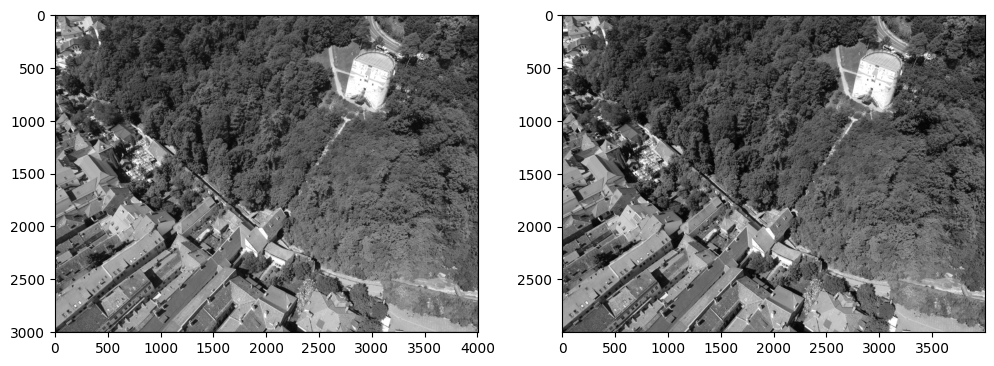

In [28]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(res_signal, cmap='gray')

plt.subplot(1, 2, 2)
plt.imshow(res_opencv, cmap='gray')

plt.show()

Using different libraries you get different result, OpenCV delimited the values until 255. Also, they treat the borders by default in a different way. In cv2, the default for the parameter is borderType=cv2.BORDER_DEFAULT = cv2.BORDER_REFLECT_101 which repeat the border values. En scipy, boundary='fill', fillvalue=0.


**Lab**

All the following questions can be answered with either predefined convolution
python functions or direct loop implementations.
Exercices:
1. For a given spatial operator, compare the filtering effect and CPU time when increasing the kernel size.
2. For a given spatial operator, compare the filtering effect and CPU time for a 2D separable kernel and its 1D alternatives.
3. Compare the results of different smoothing operators.
4. Compare the results of different sharpening operators.
5. Compare the results of different edge detection operators.
6. Are smoothing/sharpening operators invertible?
7. Compare the linear and nonlinear filtering operators.
8. Propose separable implementations of nonlinear operators.
9. Verify the ability of edge-preserving smoothing filters.

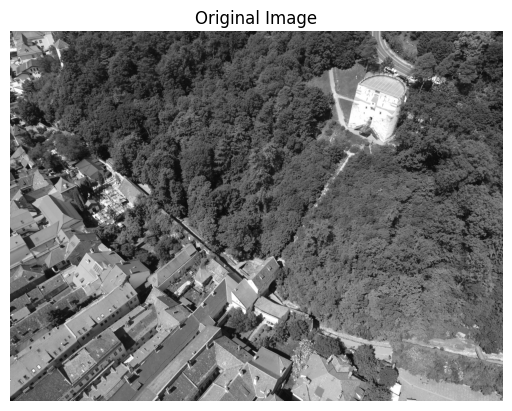

In [42]:
import cv2
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import time

# Load example image (grayscale)
image = cv2.imread("DJI_0073.JPG", cv2.IMREAD_GRAYSCALE)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()

# Helper function to measure CPU time
def measure_time(func, *args, **kwargs):
    start = time.time()
    result = func(*args, **kwargs)
    end = time.time()
    return result, end - start

# Helper function to show images
def show_images(images, titles, cmap='gray'):
    for i, image in enumerate(images):
        plt.figure(figsize=(8, 8))  # tamaño grande para cada imagen
        plt.imshow(image, cmap=cmap)
        plt.title(titles[i])
        plt.axis('off')
        plt.show()



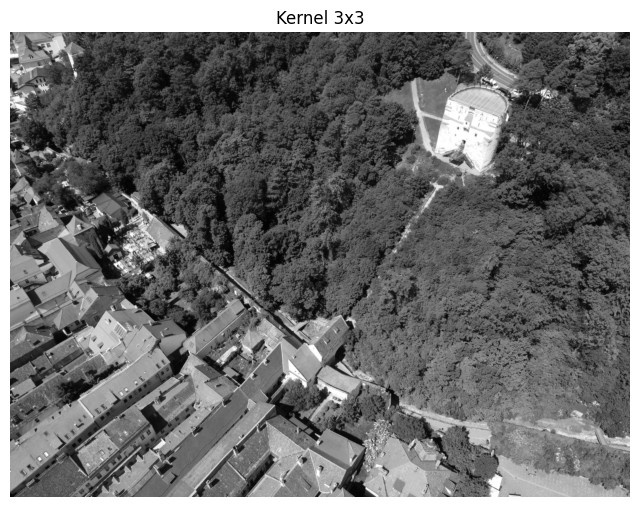

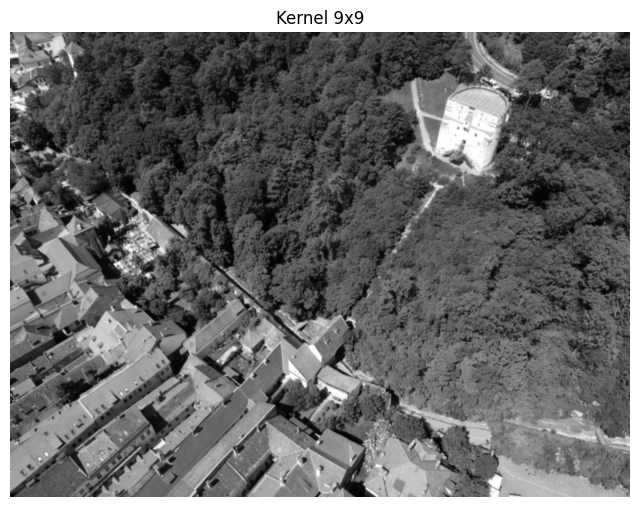

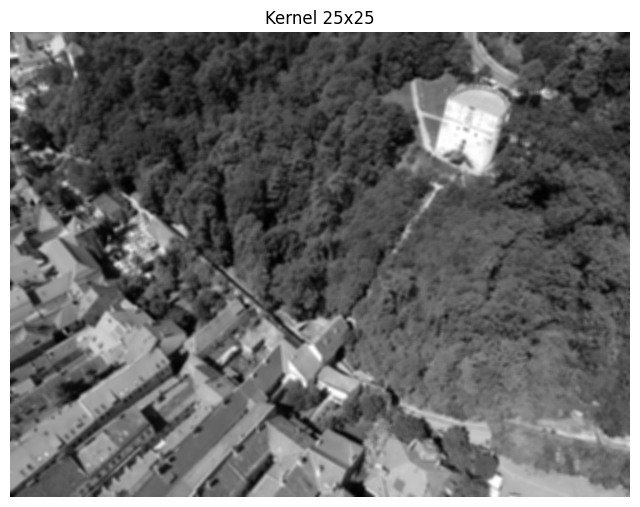

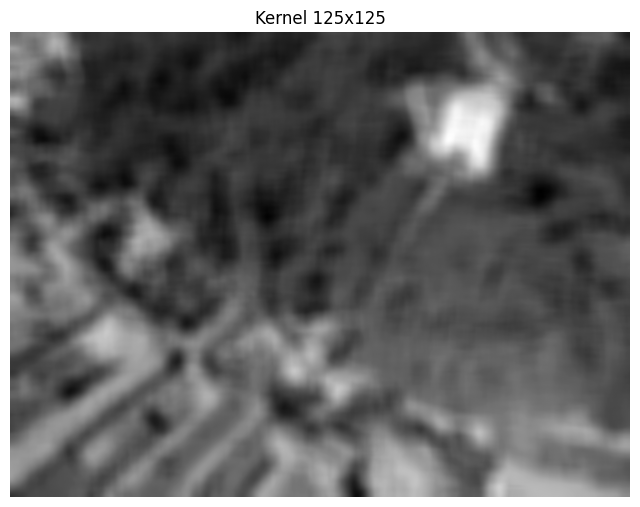

CPU times: [0.013857126235961914, 0.08826112747192383, 0.08231401443481445, 0.12826180458068848]


In [43]:
#for a given spatial operator, compare the filtering effect and CPU time when increasing the kernel size.

# Lista de tamaños de kernel
kernel_sizes = [3, 9, 25, 125]

images = []
times = []

for k in kernel_sizes:
    # Crear kernel promedio k x k
    kernel = np.ones((k,k), np.float32) / (k*k)
    
    # Aplicar filtro con filter2D y medir tiempo
    result, t = measure_time(cv2.filter2D, image, -1, kernel)
    
    images.append(result)
    times.append(t)

# Mostrar resultados
show_images(images, [f'Kernel {k}x{k}' for k in kernel_sizes])
print("CPU times:", times)

In general, when there is an increased of the kernel size there is an increase of the time.

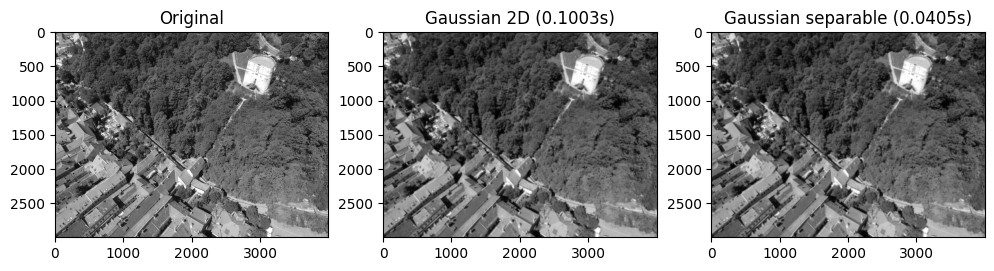

2D filter time: 0.100302 s
Separable filter time: 0.040529 s
Speedup: 2.47x faster


In [52]:
#For a given spatial operator, compare the filtering effect and CPU time for a 2D separable kernel and its 1D alternatives.
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt

# Filter size and sigma
ksize = 31
sigma = 5

# Create 1D Gaussian kernel
g1d = cv2.getGaussianKernel(ksize, sigma)

# Create 2D Gaussian kernel as an outer product
g2d = g1d @ g1d.T

# ---- Apply 2D convolution ----
start = time.time()
filtered_2d = cv2.filter2D(image, -1, g2d)
time_2d = time.time() - start

# ---- Apply separable version ----
start = time.time()
filtered_sep = cv2.sepFilter2D(image, -1, g1d, g1d)
time_sep = time.time() - start

# ---- Show results ----
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(image, cmap="gray")
plt.title("Original")

plt.subplot(1, 3, 2)
plt.imshow(filtered_2d, cmap="gray")
plt.title(f"Gaussian 2D ({time_2d:.4f}s)")

plt.subplot(1, 3, 3)
plt.imshow(filtered_sep, cmap="gray")
plt.title(f"Gaussian separable ({time_sep:.4f}s)")

plt.show()

print(f"2D filter time: {time_2d:.6f} s")
print(f"Separable filter time: {time_sep:.6f} s")
print(f"Speedup: {time_2d / time_sep:.2f}x faster")


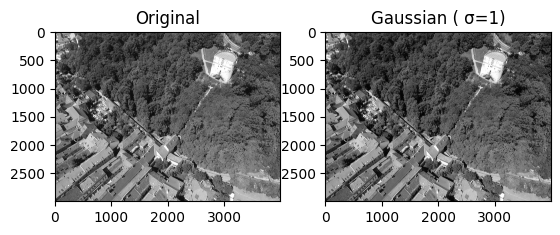

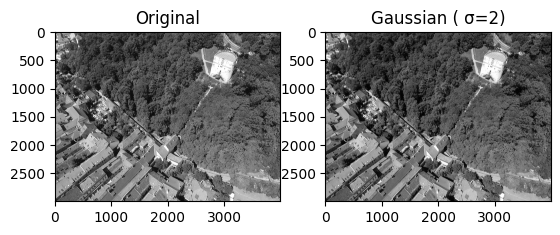

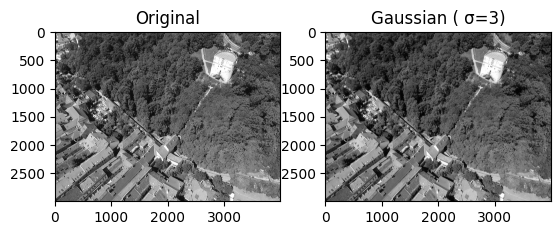

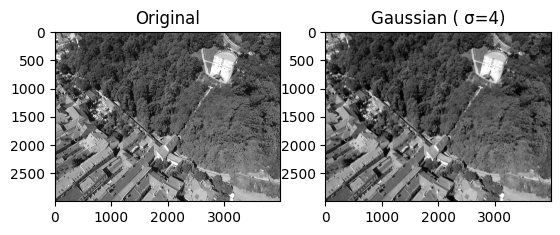

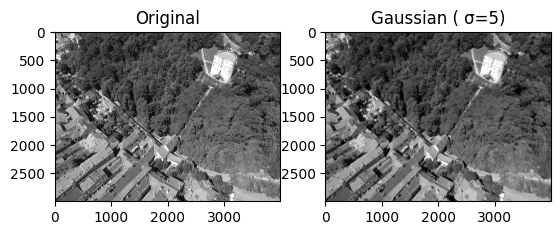

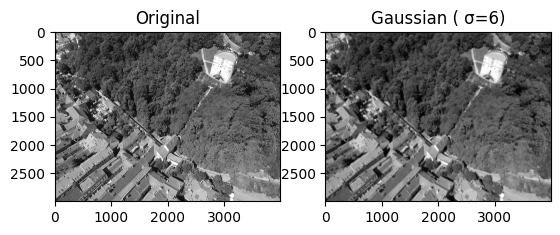

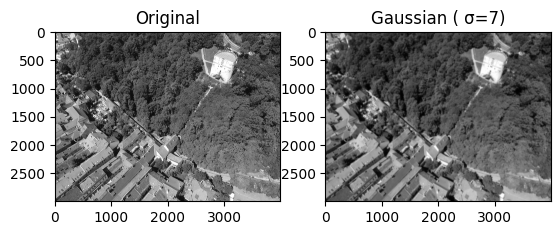

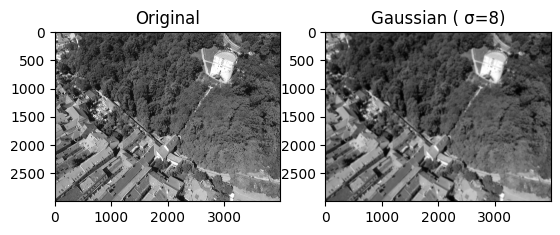

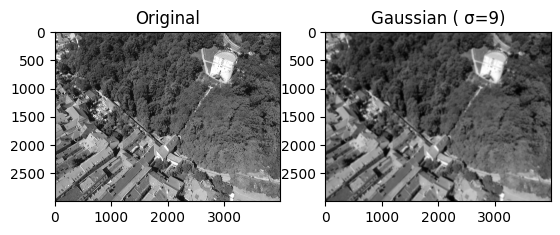

In [45]:
# smoothing operators = low pass filter W = 1
from scipy.ndimage import gaussian_filter

for i in range(1, 10):
    blurred = gaussian_filter(image, sigma=i)
    # Mostrar resultados
    plt.subplot(1,2,1)
    plt.imshow(image, cmap='gray')
    plt.title("Original")

    plt.subplot(1,2,2)
    plt.imshow(blurred, cmap='gray')
    plt.title(f"Gaussian ( σ={i})")
    plt.show()


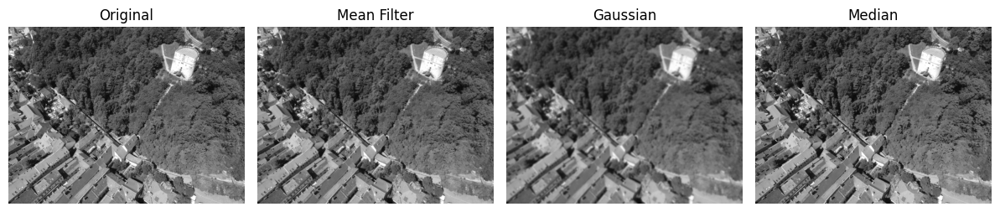

In [46]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter, gaussian_filter, median_filter


# --- 2. Aplicar filtros ---

# 2.1 Filtro promedio (mean filter)
mean_blur = uniform_filter(image, size=10)

# 2.2 Filtro gaussiano
gaussian_blur = gaussian_filter(image, sigma=10)

# 2.3 Filtro mediana
median_blur = median_filter(image, size=10)

# --- 3. Mostrar resultados ---
titles = ['Original', 'Mean Filter', 'Gaussian', 'Median']
images = [image, mean_blur, gaussian_blur, median_blur]

plt.figure(figsize=(15,5))
for i, (im, title) in enumerate(zip(images, titles), 1):
    plt.subplot(1,5,i)
    plt.imshow(im, cmap='gray', vmin=0, vmax=255)
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Convolution result second derivative')

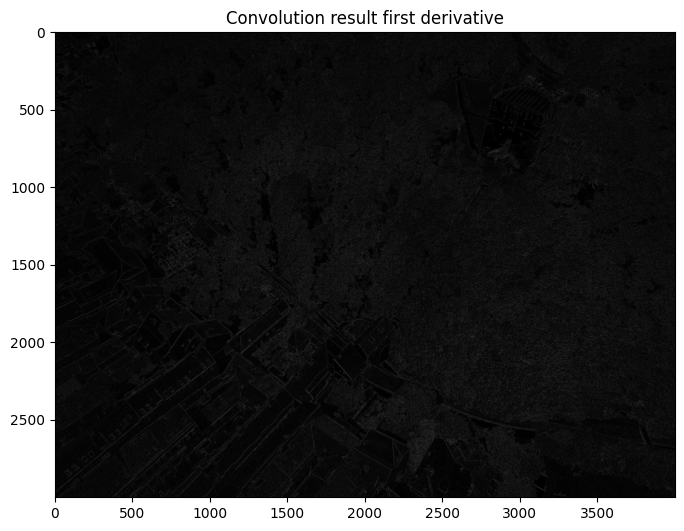

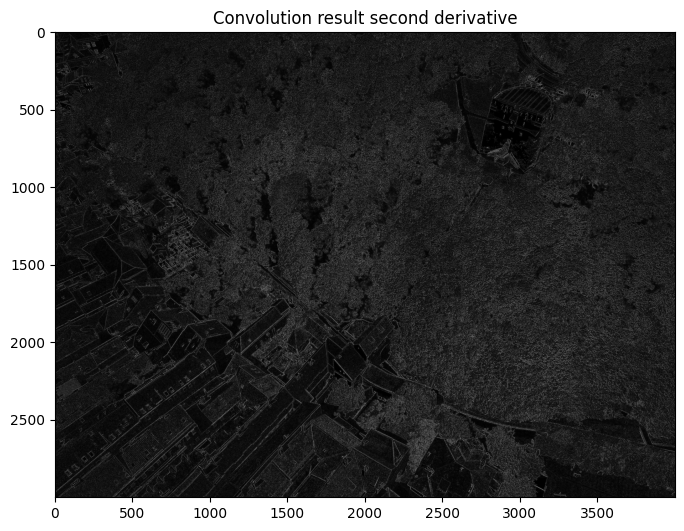

In [47]:
# sharpening operators = high pass filter


#first derivative kernel
kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])

result, t = measure_time(cv2.filter2D, image, -1, kernel)

plt.figure(figsize=(8, 8))
plt.imshow(result, cmap='gray')
plt.title("Convolution result first derivative")

#second derivative kernel
kernel = np.array([[1,1,1],[1,-8,1],[1,1,1]])

result, t = measure_time(cv2.filter2D, image, -1, kernel)

plt.figure(figsize=(8, 8))
plt.imshow(result, cmap='gray')
plt.title("Convolution result second derivative")


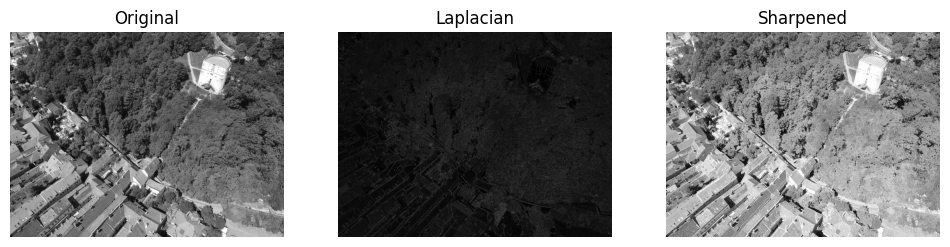

In [54]:

# Apply Laplacian (second derivative)
laplacian = cv2.Laplacian(image, cv2.CV_64F)  # Use CV_64F to avoid overflow
laplacian = np.uint8(np.absolute(laplacian))  # Convert back to uint8

# Sharpening: combine original image with weighted Laplacian
alpha = 2.5  # Sharpening intensity factor
sharp = cv2.addWeighted(image, 1.0, laplacian, alpha, 0)

# Display results
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.title("Original")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1,3,2)
plt.title("Laplacian")
plt.imshow(laplacian, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title("Sharpened")
plt.imshow(sharp, cmap='gray')
plt.axis('off')

plt.show()


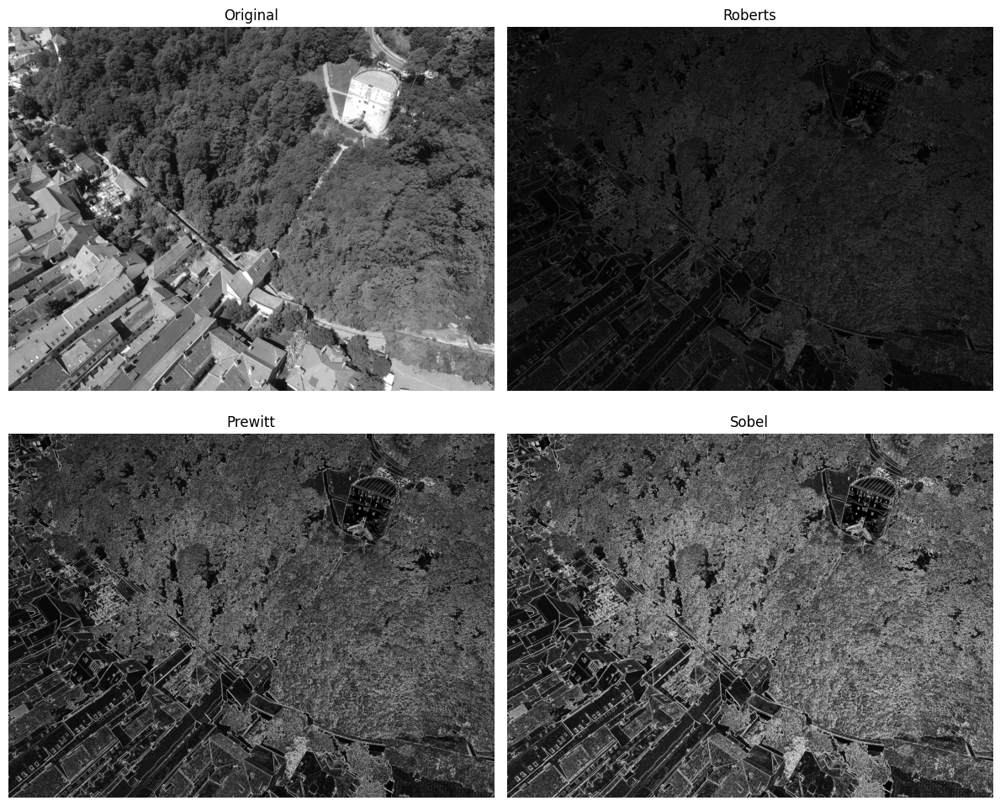

In [ ]:
# edge detection operators

from scipy.signal import convolve2d


# --- Roberts Operator ---
roberts_vertical = np.array([[-1, 0],[ 0, 1]])
roberts_horizontal = np.array([[0, -1],[1,  0]])

# --- Prewitt Operator ---
prewitt_vertical = np.array([[-1, 0, 1],[-1, 0, 1],[-1, 0, 1]])
prewitt_horizontal = np.array([[-1, -1, -1],[ 0,  0,  0],[ 1,  1,  1]])

# --- Sobel Operator ---
sobel_vertical = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
sobel_horizontal = np.array([[-1, -2, -1],[ 0,  0,  0],[ 1,  2,  1]])

# Function to apply filter using convolution
def apply_filter(image, kernel):
    return convolve2d(image, kernel, mode='same', boundary='symm')

# Apply all filters
roberts_v = apply_filter(image, roberts_vertical)
roberts_h = apply_filter(image, roberts_horizontal)
prewitt_v = apply_filter(image, prewitt_vertical)
prewitt_h = apply_filter(image, prewitt_horizontal)
sobel_v = apply_filter(image, sobel_vertical)
sobel_h = apply_filter(image, sobel_horizontal)

# Compute edge magnitude for visualization
roberts_edge = np.sqrt(roberts_v**2 + roberts_h**2)
prewitt_edge = np.sqrt(prewitt_v**2 + prewitt_h**2)
sobel_edge = np.sqrt(sobel_v**2 + sobel_h**2)

# Convert to uint8 for display
roberts_edge = np.uint8(np.clip(roberts_edge, 0, 255))
prewitt_edge = np.uint8(np.clip(prewitt_edge, 0, 255))
sobel_edge = np.uint8(np.clip(sobel_edge, 0, 255))

# Display results
plt.figure(figsize=(12,10))

plt.subplot(2,2,1)
plt.title("Original")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(2,2,2)
plt.title("Roberts")
plt.imshow(roberts_edge, cmap='gray')
plt.axis('off')

plt.subplot(2,2,3)
plt.title("Prewitt")
plt.imshow(prewitt_edge, cmap='gray')
plt.axis('off')

plt.subplot(2,2,4)
plt.title("Sobel")
plt.imshow(sobel_edge, cmap='gray')
plt.axis('off')

plt.tight_layout()  # Ajusta espacios automáticamente
plt.show()



## Are smoothing/sharpening operators invertible?

Smoothing operators, like Gaussian blur, are not invertible because they remove fine details and high-frequency information, making the original image unrecoverable. Many images can have the same blurry result and go back to an specific one is not possible.

Sharpening operators enhance edges and details and can sometimes be approximately reversed if the exact filter is known, but noise and numerical errors prevent perfect inversion. This can be determinated by the formula because we sum the original, so we could rest that.

# Linear vs Nonlinear Filtering Operators

## Linear Operators
- Definition: The output is a **linear combination of input pixel values**.  
- Examples: Gaussian filter, Sobel, Laplacian.  
- Characteristics:
  - Smooth or sharpen images in a predictable way.
  - Can be implemented as **convolution** with a kernel.
  - Efficient to compute.
- Limitations:
  - Sensitive to impulse noise (e.g., salt-and-pepper).
  - May blur edges while smoothing.

## Nonlinear Operators
- Definition: The output **cannot be expressed as a linear combination** of input pixels; it may involve medians or other nonlinear operations.  
- Examples: Median filter, Bilateral filter, Morphological operators.  
- Characteristics:
  - Better at **preserving edges** while reducing noise.
  - More robust to **non-Gaussian noise**.
- Limitations:
  - Usually more computationally expensive.
  - Harder to analyze mathematically.


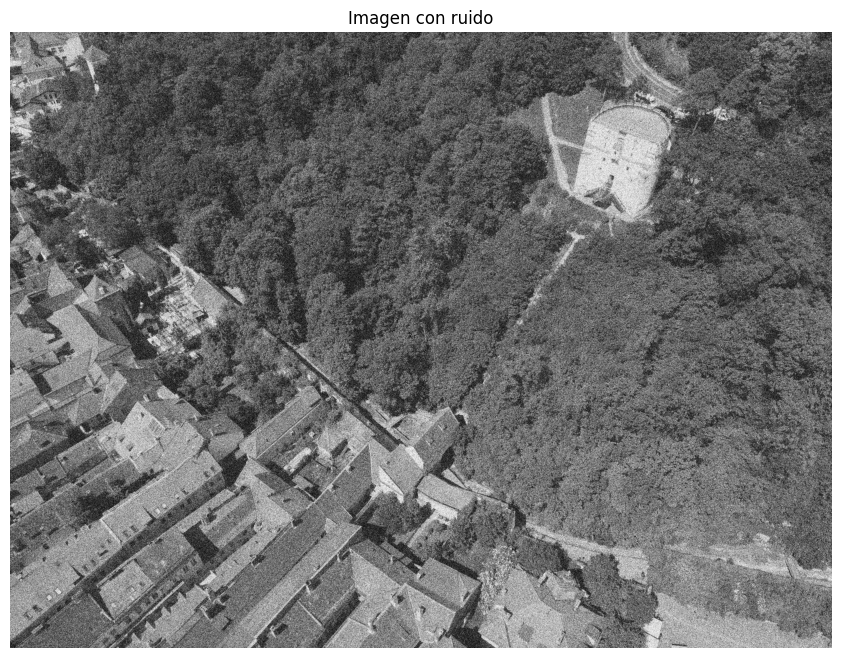

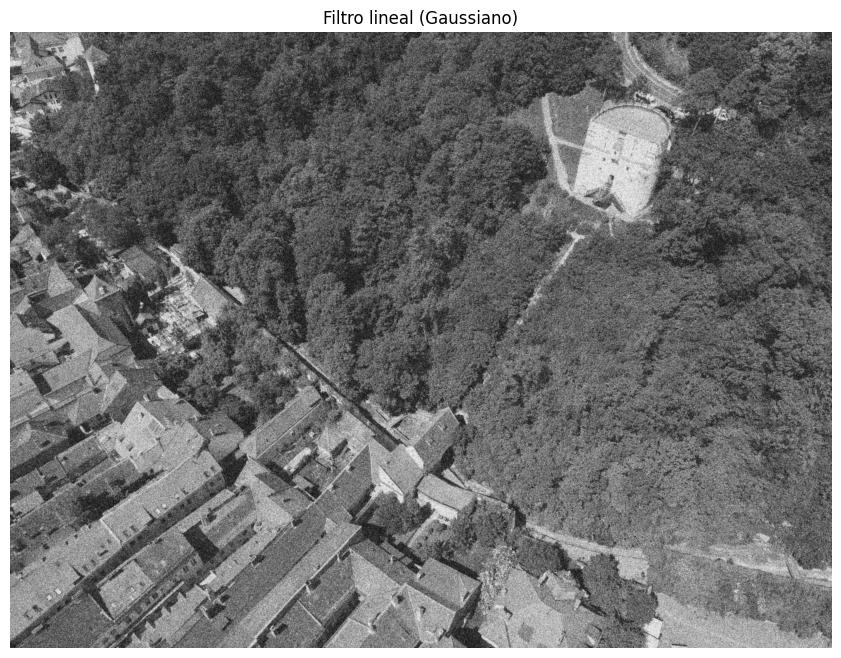

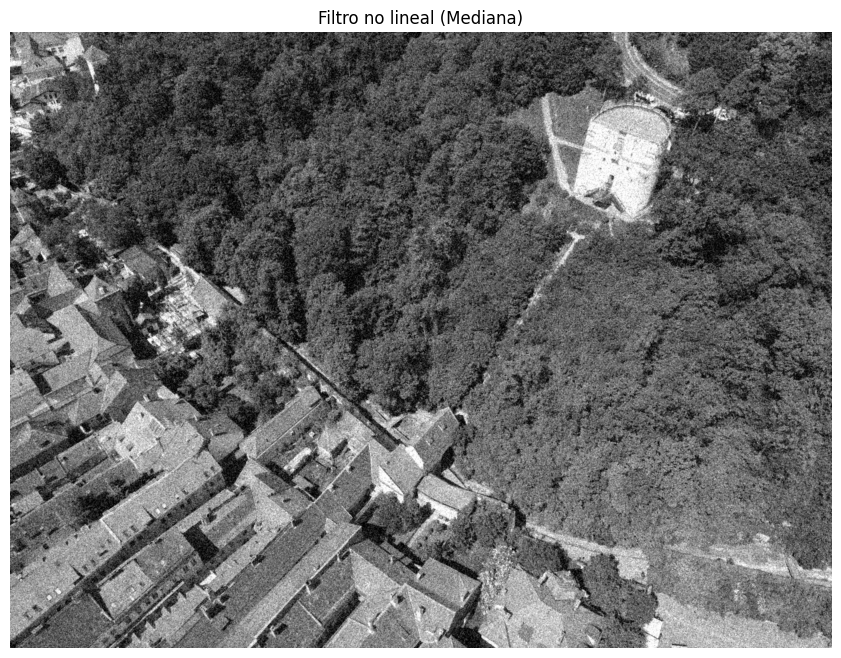

In [64]:
#Compare the linear and nonlinear filtering operators.
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Agregar ruido a la imagen
noisy = image + 90 * np.random.randn(*image.shape)
noisy = np.clip(noisy, 0, 255).astype(np.uint8)

# --- Operador lineal: filtro Gaussiano ---
linear_filtered = cv2.GaussianBlur(noisy, (5, 5), 1)

# --- Operador no lineal: filtro de Mediana ---
nonlinear_filtered = cv2.medianBlur(noisy, 5)

# Visualización
plt.figure(figsize=(15, 8))

#plt.subplot(1, 3, 1)
plt.title("Imagen con ruido")
plt.imshow(noisy, cmap="gray")
plt.axis("off")
plt.show()

plt.figure(figsize=(15, 8))
#plt.subplot(1, 3, 2)
plt.title("Filtro lineal (Gaussiano)")
plt.imshow(linear_filtered, cmap="gray")
plt.axis("off")
plt.show()  

plt.figure(figsize=(15, 8))
#plt.subplot(1, 3, 3)
plt.title("Filtro no lineal (Mediana)")
plt.imshow(nonlinear_filtered, cmap="gray")
plt.axis("off")
plt.show()
#plt.tight_layout()
#plt.show()


In [ ]:
#Verify the ability of edge-preserving smoothing filters.

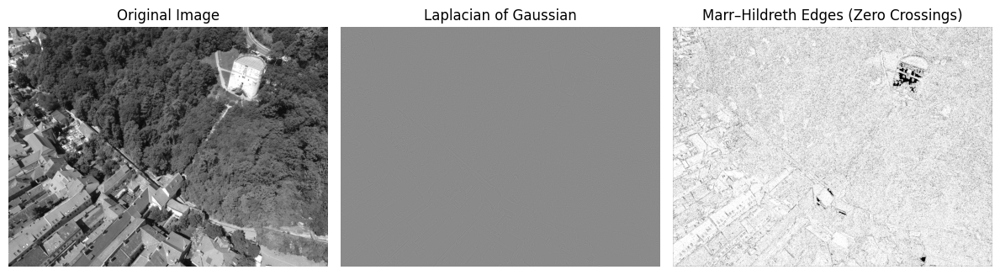

In [65]:

# --- Step 1: Gaussian smoothing ---
# Reduce noise before computing derivatives
blurred = cv2.GaussianBlur(image, (5, 5), sigmaX=1.0)

# --- Step 2: Apply Laplacian operator ---
# Compute the second derivative (Laplacian)
laplacian = cv2.Laplacian(blurred, cv2.CV_64F)

# --- Step 3: Zero-crossing detection ---
# Detect where the Laplacian changes sign (edge locations)
zero_crossing = np.zeros_like(laplacian, dtype=np.uint8)
lap_sign = np.sign(laplacian)

for i in range(1, laplacian.shape[0] - 1):
    for j in range(1, laplacian.shape[1] - 1):
        region = lap_sign[i - 1:i + 2, j - 1:j + 2]
        if region.max() > 0 and region.min() < 0:
            zero_crossing[i, j] = 255

# --- Step 4: Display results ---
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(laplacian, cmap='gray')
plt.title("Laplacian of Gaussian")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(zero_crossing, cmap='gray')
plt.title("Marr–Hildreth Edges (Zero Crossings)")
plt.axis('off')

plt.tight_layout()
plt.show()


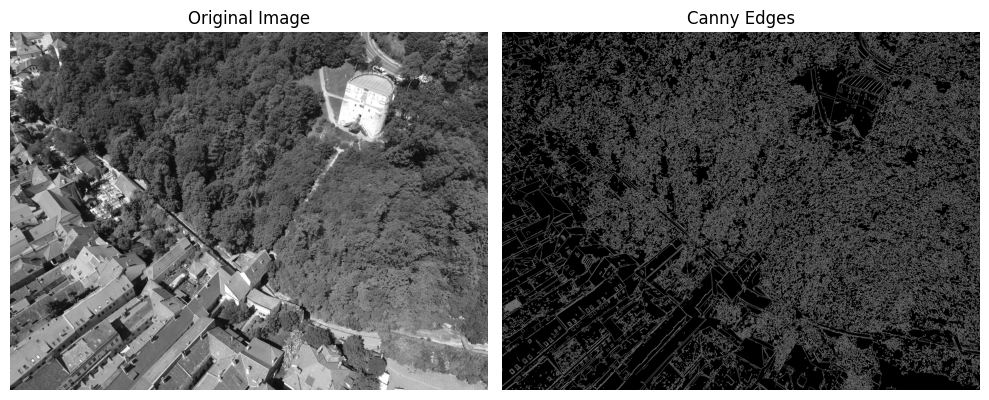

In [66]:
# Canny edge detector
import cv2
import numpy as np
import matplotlib.pyplot as plt


# --- 2. Apply Gaussian blur to reduce noise ---
blurred = cv2.GaussianBlur(image, (5, 5), 1.0)

# --- 3. Apply Canny edge detector ---
# threshold1: lower threshold for hysteresis
# threshold2: upper threshold for hysteresis
edges = cv2.Canny(blurred, threshold1=50, threshold2=150)

# --- 4. Display results ---
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title("Canny Edges")
plt.imshow(edges, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

